In [ ]:
using Pkg
Pkg.add("HDF5")
Pkg.add("FITSIO")
Pkg.add("GZip")
Pkg.add("Plots")
Pkg.add("Statistics")
Pkg.add("Test")
Pkg.add("ProgressBars")
Pkg.add("ResumableFunctions")

In [4]:
using FITSIO
"""
    DictMetadata

A structure containing metadata from FITS file headers.

Fields
------
- `headers::Vector{Dict{String,Any}}`: A vector of dictionaries containing header information from each HDU.
"""
struct DictMetadata
    headers::Vector{Dict{String,Any}}
end

"""
    EventList{T}

A structure containing event data from a FITS file.

Fields
------
- `filename::String`: Path to the source FITS file.
- `times::Vector{T}`: Vector of event times.
- `energies::Vector{T}`: Vector of event energies.
- `metadata::DictMetadata`: Metadata information extracted from the FITS file headers.
"""
struct EventList{T}
    filename::String
    times::Vector{T}
    energies::Vector{T}
    metadata::DictMetadata
end
function readevents(path; T = Float64)
    headers = Dict{String,Any}[]
    times = T[]
    energies = T[]

    FITS(path, "r") do f
        for i = 1:length(f)  # Iterate over HDUs
            hdu = f[i]
            header_dict = Dict{String,Any}()
            for key in keys(read_header(hdu))
                header_dict[string(key)] = read_header(hdu)[key]
            end
            push!(headers, header_dict)

            # Check if the HDU is a table
            if isa(hdu, TableHDU)
                # Get column names using the correct FITSIO method
                colnames = FITSIO.colnames(hdu)

                if "TIME" in colnames
                    times = convert(Vector{T}, read(hdu, "TIME"))
                end
                if "ENERGY" in colnames
                    energies = convert(Vector{T}, read(hdu, "ENERGY"))
                end
            end
        end
    end
    if isempty(times)
        @warn "No TIME data found in FITS file $(path). Time series analysis will not be possible."
    end

    if isempty(energies)
        @warn "No ENERGY data found in FITS file $(path). Energy spectrum analysis will not be possible."
    end

    metadata = DictMetadata(headers)
    return EventList{T}(path, times, energies, metadata)
end
struct LightCurve{T}
    timebins::Vector{T}
    counts::Vector{T}
    count_error::Vector{T}
    err_method::Symbol
end
function create_lightcurve(eventlist::EventList{T}, bin_size::T=0.1; err_method::Symbol=:poisson) where T
    if isempty(eventlist.times)
        error("Cannot create light curve: time data is empty")
    end
    
    if err_method != :poisson && err_method != :sqrtN
        throw(ArgumentError("Unrecognized error method: $err_method"))
    end
    
    min_time = minimum(eventlist.times)
    max_time = maximum(eventlist.times)
    edges = min_time:bin_size:(max_time + bin_size)
    bin_centers = edges[1:end-1] .+ bin_size/2
    n_bins = length(bin_centers)
    counts = zeros(Int, n_bins)
    errors = zeros(T, n_bins)
    for t in eventlist.times
        bin_idx = floor(Int, (t - min_time) / bin_size) + 1
        if 1 <= bin_idx <= n_bins
            counts[bin_idx] += 1
        end
    end
    if err_method == :poisson || err_method == :sqrtN
        errors .= sqrt.(counts)
    end
    return LightCurve{T}(bin_centers, counts, errors, err_method)
end

create_lightcurve (generic function with 2 methods)

In [5]:
using Test
using Logging 
@testset "EventList Tests" begin
    # Test 1: Create a sample FITS file for testing
    @testset "Sample FITS file creation" begin
        test_dir = mktempdir()
        sample_file = joinpath(test_dir, "sample.fits")
        f = FITS(sample_file, "w")
        write(f, Int[])  # Empty primary array       
        # Create a binary table HDU with TIME and ENERGY columns
        times = Float64[1.0, 2.0, 3.0, 4.0, 5.0]
        energies = Float64[10.0, 20.0, 15.0, 25.0, 30.0]
        # Add a binary table extension
        table = Dict{String,Array}()
        table["TIME"] = times
        table["ENERGY"] = energies
        write(f, table)
        close(f)

        @test isfile(sample_file)

        # Test reading the sample file
        data = readevents(sample_file)
        @test data.filename == sample_file
        @test length(data.times) == 5
        @test length(data.energies) == 5
        @test eltype(data.times) == Float64
        @test eltype(data.energies) == Float64
    end

    # Test 2: Test with different data types
    @testset "Different data types" begin
        test_dir = mktempdir()
        sample_file = joinpath(test_dir, "sample_float32.fits")
        f = FITS(sample_file, "w")
        write(f, Int[])
        # Create data
        times = Float64[1.0, 2.0, 3.0]
        energies = Float64[10.0, 20.0, 30.0]
        table = Dict{String,Array}()
        table["TIME"] = times
        table["ENERGY"] = energies
        write(f, table)
        close(f)
        # Test with Float32
        data_f32 = readevents(sample_file, T = Float32)
        @test eltype(data_f32.times) == Float32
        @test eltype(data_f32.energies) == Float32
        # Test with Int64
        data_i64 = readevents(sample_file, T = Int64)
        @test eltype(data_i64.times) == Int64
        @test eltype(data_i64.energies) == Int64
    end

    # Test 3: Test with missing columns
    @testset "Missing columns" begin
        test_dir = mktempdir()
        sample_file = joinpath(test_dir, "sample_no_energy.fits")
        # Create a sample FITS file with only TIME column
        f = FITS(sample_file, "w")
        write(f, Int[])
        times = Float64[1.0, 2.0, 3.0]
        table = Dict{String,Array}()
        table["TIME"] = times
        write(f, table)
        close(f)
        
        # First define the variable outside the block
        local data
        # Then use @test_logs with a begin/end block and assign to the variable
        @test_logs (:warn, "No ENERGY data found in FITS file $(sample_file). Energy spectrum analysis will not be possible.") begin
            data = readevents(sample_file)
        end
        # Now data is accessible here
        @test length(data.times) == 3
        @test length(data.energies) == 0
        
        #create a file with only ENERGY column
        sample_file2 = joinpath(test_dir, "sample_no_time.fits")
        f = FITS(sample_file2, "w")
        write(f, Int[])  # Empty primary array
        energies = Float64[10.0, 20.0, 30.0]
        table = Dict{String,Array}()
        table["ENERGY"] = energies
        write(f, table)
        close(f)
        
        # Same approach for data2
        local data2
        @test_logs (:warn, "No TIME data found in FITS file $(sample_file2). Time series analysis will not be possible.") begin
            data2 = readevents(sample_file2)
        end
        @test length(data2.times) == 0  # No TIME column
        @test length(data2.energies) == 3
    end
    # Test 4: Test with multiple HDUs
    @testset "Multiple HDUs" begin
        test_dir = mktempdir()
        sample_file = joinpath(test_dir, "sample_multi_hdu.fits")
        # Create a sample FITS file with multiple HDUs
        f = FITS(sample_file, "w")
        write(f, Int[])
        times1 = Float64[1.0, 2.0, 3.0]
        energies1 = Float64[10.0, 20.0, 30.0]
        table1 = Dict{String,Array}()
        table1["TIME"] = times1
        table1["ENERGY"] = energies1
        write(f, table1)
        # Second table HDU (with OTHER column)
        other_data = Float64[100.0, 200.0, 300.0]
        table2 = Dict{String,Array}()
        table2["OTHER"] = other_data
        write(f, table2)
        # Third table HDU (with TIME only)
        times3 = Float64[4.0, 5.0, 6.0]
        table3 = Dict{String,Array}()
        table3["TIME"] = times3
        write(f, table3)
        close(f)
        data = readevents(sample_file)
        @test length(data.metadata.headers) == 4  # Primary + 3 table HDUs
        # Should read the first HDU with both TIME and ENERGY
        @test length(data.times) == 3
        @test length(data.energies) == 3
    end

    # Test 5: Test with monol_testA.evt
    @testset "Real test files" begin
        test_filepath = joinpath("data", "monol_testA.evt")
        if isfile(test_filepath)
            @testset "monol_testA.evt" begin
                # Create a logger that suppresses warnings
                old_logger = global_logger(ConsoleLogger(stderr, Logging.Error))
                try
                    data = readevents(test_filepath)
                    @test data.filename == test_filepath
                    @test length(data.metadata.headers) > 0
                finally
                    # Restore the previous logger
                    global_logger(old_logger)
                end
            end
        else
            @info "Test file '$(test_filepath)' not found. Skipping this test."
        end
    end
    @testset "Error handling" begin
        # Test with non-existent file - using a more generic approach
        @test_throws Exception readevents("non_existent_file.fits")

        # Test with invalid FITS file
        invalid_file = tempname()
        open(invalid_file, "w") do io
            write(io, "This is not a FITS file")
        end
        @test_throws Exception readevents(invalid_file)
    end
end

Test Summary:   | Pass  Total  Time
EventList Tests |   23     23  3.7s


Test.DefaultTestSet("EventList Tests", Any[Test.DefaultTestSet("Sample FITS file creation", Any[], 6, false, false, true, 1.742769775703e9, 1.742769778586e9, false, "In[5]"), Test.DefaultTestSet("Different data types", Any[], 4, false, false, true, 1.742769778586e9, 1.742769778857e9, false, "In[5]"), Test.DefaultTestSet("Missing columns", Any[], 6, false, false, true, 1.742769778857e9, 1.742769778984e9, false, "In[5]"), Test.DefaultTestSet("Multiple HDUs", Any[], 3, false, false, true, 1.742769778984e9, 1.742769779016e9, false, "In[5]"), Test.DefaultTestSet("Real test files", Any[Test.DefaultTestSet("monol_testA.evt", Any[], 2, false, false, true, 1.742769779016e9, 1.742769779152e9, false, "In[5]")], 0, false, false, true, 1.742769779016e9, 1.742769779152e9, false, "In[5]"), Test.DefaultTestSet("Error handling", Any[], 2, false, false, true, 1.742769779152e9, 1.742769779356e9, false, "In[5]")], 0, false, false, true, 1.742769775669e9, 1.742769779356e9, false, "In[5]")

In [6]:
using Test
using FFTW, Distributions, Statistics, StatsBase, HDF5, FITSIO
using Logging
using RecipesBase
using Plots

In [7]:
using RecipesBase
using Statistics

"""
    f(el::EventList{T}, bin_size::Real=0.1; tstart=nothing, tseg=nothing, show_errors=true, show_gaps=false, gap_threshold=10.0, axis_limits=nothing) where T

Recipe for plotting an EventList directly as a light curve.

# Arguments
- `el`: EventList containing time and energy data
- `bin_size`: Size of time bins for the light curve
- `tstart`: Optional starting time for light curve (defaults to minimum time)
- `tseg`: Optional time segment length (defaults to full range)
- `show_errors`: Whether to display Poisson error bars
- `show_gaps`: Whether to highlight data gaps
- `gap_threshold`: Multiplier of median time difference to identify gaps
- `axis_limits`: Optional array of [xmin, xmax, ymin, ymax] for plot limits
"""
@recipe function f(el::EventList{T}, bin_size::Real=0.1; tstart=nothing, tseg=nothing, show_errors=true, show_gaps=false, gap_threshold=10.0, axis_limits=nothing) where T
    bin_size_t = convert(T, bin_size)
    
    if isempty(el.times)
        @warn "Event list contains no time data. Cannot create light curve."
        return [], []
    end
    
    min_time = minimum(el.times)
    max_time = maximum(el.times)
    
    start_time = isnothing(tstart) ? min_time : convert(T, tstart)
    end_time = isnothing(tseg) ? max_time : start_time + convert(T, tseg)
    
    filtered_times = filter(t -> start_time <= t <= end_time, el.times)
    
    edges = start_time:bin_size_t:(end_time + bin_size_t)
    bin_centers = edges[1:end-1] .+ bin_size_t/2
    n_bins = length(bin_centers)
    
    counts = zeros(Int, n_bins)
    for t in filtered_times
        bin_idx = floor(Int, (t - start_time) / bin_size_t) + 1
        if 1 <= bin_idx <= n_bins
            counts[bin_idx] += 1
        end
    end
    
    errors = sqrt.(float.(counts))
    
    if !isnothing(axis_limits)
        if length(axis_limits) == 4
            xmin, xmax, ymin, ymax = axis_limits
            
            if !isnothing(xmin) && !isnothing(xmax)
                xlims --> (xmin, xmax)
            elseif !isnothing(xmin)
                xlims --> (xmin, :auto)
            elseif !isnothing(xmax)
                xlims --> (:auto, xmax)
            end
            
            if !isnothing(ymin) && !isnothing(ymax)
                ylims --> (ymin, ymax)
            elseif !isnothing(ymin)
                ylims --> (ymin, :auto)
            elseif !isnothing(ymax)
                ylims --> (:auto, ymax)
            end
        else
            @warn "axis_limits should be an array of 4 elements [xmin, xmax, ymin, ymax]"
        end
    end
    
    if show_gaps
        sorted_times = sort(filtered_times)
        time_diffs = diff(sorted_times)
        median_diff = median(time_diffs)
        threshold = gap_threshold * median_diff
        gap_indices = findall(diff -> diff > threshold, time_diffs)
        
        gap_starts = sorted_times[gap_indices]
        gap_ends = sorted_times[gap_indices .+ 1]
        
        @series begin
            title := "Light Curve with Gaps Highlighted"
            xlabel := "Time"
            ylabel := "Counts"
            seriestype := :steppost
            linewidth := 2
            color := :blue
            label := "Light Curve (bin size: $bin_size_t)"
            bin_centers, counts
        end
        
        max_count = isempty(counts) ? one(T) : maximum(counts)
        
        if !isempty(gap_starts)
            for (i, (start, stop)) in enumerate(zip(gap_starts, gap_ends))
                @series begin
                    seriestype := :shape
                    fillalpha := 0.3
                    fillcolor := :red
                    linecolor := :red
                    label := i == 1 ? "Gaps (threshold: $(round(threshold, digits=2)))" : nothing
                    [start, stop, stop, start, start], 
                    [zero(T), zero(T), max_count, max_count, zero(T)]
                end
            end
        end
        
        return [], []
    else
        title --> "Light Curve"
        xlabel --> "Time"
        ylabel --> "Counts"
        
        if show_errors
            seriestype --> :scatter
            yerror --> errors
            label --> "Light Curve with Poisson errors"
        else
            seriestype --> :steppost
            label --> "Light Curve (bin size: $bin_size_t)"
        end
        
        return bin_centers, counts
    end
end

"""
    f(lc::LightCurve{T}; show_errors=true, show_gaps=false, gap_threshold=10.0, axis_limits=nothing) where T

Recipe for plotting a LightCurve object with optional error bars and gap highlighting.

# Arguments
- `lc`: LightCurve object containing binned time series data
- `show_errors`: Whether to display error bars
- `show_gaps`: Whether to highlight data gaps
- `gap_threshold`: Multiplier of median time difference to identify gaps
- `axis_limits`: Optional array of [xmin, xmax, ymin, ymax] for plot limits
"""
@recipe function f(lc::LightCurve{T}; show_errors=true, show_gaps=false, gap_threshold=10.0, axis_limits=nothing) where T
    if !isnothing(axis_limits)
        if length(axis_limits) == 4
            xmin, xmax, ymin, ymax = axis_limits
            
            if !isnothing(xmin) && !isnothing(xmax)
                xlims --> (xmin, xmax)
            elseif !isnothing(xmin)
                xlims --> (xmin, :auto)
            elseif !isnothing(xmax)
                xlims --> (:auto, xmax)
            end
            
            if !isnothing(ymin) && !isnothing(ymax)
                ylims --> (ymin, ymax)
            elseif !isnothing(ymin)
                ylims --> (ymin, :auto)
            elseif !isnothing(ymax)
                ylims --> (:auto, ymax)
            end
        else
            @warn "axis_limits should be an array of 4 elements [xmin, xmax, ymin, ymax]"
        end
    end
    
    if !show_gaps
        title --> "Light Curve"
        xlabel --> "Time"
        ylabel --> "Counts"
        
        if show_errors
            seriestype --> :scatter
            yerror --> lc.count_error
            label --> "Light Curve with $(lc.err_method) errors"
        else
            seriestype --> :steppost
            label --> "Light Curve"
        end
        
        return lc.timebins, lc.counts
    else
        if length(lc.timebins) > 1
            bin_width = lc.timebins[2] - lc.timebins[1]
        else
            bin_width = one(T)
        end
        
        pseudo_events = T[]
        for (t, count) in zip(lc.timebins, lc.counts)
            if count > 0
                if count == 1
                    push!(pseudo_events, t)
                else
                    half_width = bin_width / 2
                    event_spacing = bin_width / count
                    for i in 1:count
                        event_time = t - half_width + (i-0.5)*event_spacing
                        push!(pseudo_events, event_time)
                    end
                end
            end
        end
        
        sort!(pseudo_events)
        
        gaps = Tuple{T,T}[]
        if length(pseudo_events) > 1
            time_diffs = diff(pseudo_events)
            median_diff = median(time_diffs)
            threshold = gap_threshold * median_diff
            
            gap_indices = findall(diff -> diff > threshold, time_diffs)
            
            for idx in gap_indices
                start_time = pseudo_events[idx]
                end_time = pseudo_events[idx+1]
                push!(gaps, (start_time, end_time))
            end
        end
        
        @series begin
            title := "Light Curve with Gaps Highlighted"
            xlabel := "Time"
            ylabel := "Counts"
            seriestype := :steppost
            linewidth := 2
            color := :blue
            label := "Light Curve"
            lc.timebins, lc.counts
        end
        
        max_count = isempty(lc.counts) ? one(T) : maximum(lc.counts)
        
        if !isempty(gaps)
            for (i, (start, stop)) in enumerate(gaps)
                @series begin
                    seriestype := :shape
                    fillalpha := 0.3
                    fillcolor := :red
                    linecolor := :red
                    label := i == 1 ? "Gaps" : nothing
                    [start, stop, stop, start, start], 
                    [zero(T), zero(T), max_count, max_count, zero(T)]
                end
            end
        end
        
        return [], []
    end
end

"""
    f(::Type{LightCurve}, el::EventList{T}, bin_size::Real=0.1; 
      tstart=nothing, tseg=nothing, show_gaps=false, gap_threshold=10.0, axis_limits=nothing) where T

Recipe that converts an EventList to a LightCurve for plotting.

# Arguments
- `el`: EventList containing time and energy data
- `bin_size`: Size of time bins for the light curve
- `tstart`: Optional starting time for light curve
- `tseg`: Optional time segment length
- `show_gaps`: Whether to highlight data gaps
- `gap_threshold`: Multiplier of median time difference to identify gaps
- `axis_limits`: Optional array of [xmin, xmax, ymin, ymax] for plot limits
"""
@recipe function f(::Type{LightCurve}, el::EventList{T}, bin_size::Real=0.1; 
                  tstart=nothing, tseg=nothing, show_gaps=false, gap_threshold=10.0, axis_limits=nothing) where T
    bin_size_t = convert(T, bin_size)
    
    min_time = minimum(el.times)
    max_time = maximum(el.times)
    
    start_time = isnothing(tstart) ? min_time : convert(T, tstart)
    end_time = isnothing(tseg) ? max_time : start_time + convert(T, tseg)
    
    filtered_times = filter(t -> start_time <= t <= end_time, el.times)
    
    edges = start_time:bin_size_t:(end_time + bin_size_t)
    bin_centers = edges[1:end-1] .+ bin_size_t/2
    n_bins = length(bin_centers)
    
    counts = zeros(Int, n_bins)
    for t in filtered_times
        bin_idx = floor(Int, (t - start_time) / bin_size_t) + 1
        if 1 <= bin_idx <= n_bins
            counts[bin_idx] += 1
        end
    end
    
    errors = sqrt.(float.(counts))
    
    lc = LightCurve{T}(
        bin_centers,
        convert.(T, counts),
        convert.(T, errors),
        :poisson
    )
    
    if !isnothing(axis_limits)
        if length(axis_limits) == 4
            xmin, xmax, ymin, ymax = axis_limits
            
            if !isnothing(xmin) && !isnothing(xmax)
                xlims --> (xmin, xmax)
            elseif !isnothing(xmin)
                xlims --> (xmin, :auto)
            elseif !isnothing(xmax)
                xlims --> (:auto, xmax)
            end
            
            if !isnothing(ymin) && !isnothing(ymax)
                ylims --> (ymin, ymax)
            elseif !isnothing(ymin)
                ylims --> (ymin, :auto)
            elseif !isnothing(ymax)
                ylims --> (:auto, ymax)
            end
        else
            @warn "axis_limits should be an array of 4 elements [xmin, xmax, ymin, ymax]"
        end
    end
    
    if show_gaps
        sorted_times = sort(filtered_times)
        time_diffs = diff(sorted_times)
        median_diff = median(time_diffs)
        threshold = gap_threshold * median_diff
        gap_indices = findall(diff -> diff > threshold, time_diffs)
        
        gap_starts = sorted_times[gap_indices]
        gap_ends = sorted_times[gap_indices .+ 1]
        
        @series begin
            title := "Light Curve with Gaps Highlighted"
            xlabel := "Time"
            ylabel := "Counts"
            seriestype := :steppost
            linewidth := 2
            color := :blue
            label := "Light Curve (bin size: $bin_size_t)"
            lc.timebins, lc.counts
        end
        
        max_count = isempty(counts) ? one(T) : maximum(counts)
        
        if !isempty(gap_starts)
            for (i, (start, stop)) in enumerate(zip(gap_starts, gap_ends))
                @series begin
                    seriestype := :shape
                    fillalpha := 0.3
                    fillcolor := :red
                    linecolor := :red
                    label := i == 1 ? "Gaps (threshold: $(round(threshold, digits=2)))" : nothing
                    [start, stop, stop, start, start], 
                    [zero(T), zero(T), max_count, max_count, zero(T)]
                end
            end
        end
        
        return [], []
    else
        title --> "Light Curve"
        xlabel --> "Time"
        ylabel --> "Counts"
        seriestype --> :steppost
        label --> "Light Curve (bin size: $bin_size_t)"
        
        return lc.timebins, lc.counts
    end
end

"""
    f(::Type{Val{:events}}, x, y, z; color=:auto, markersize=4)

Recipe for rendering a general events timeline using vertical markers.
Creates a scatter plot with vertical line markers positioned at the x-coordinates.

# Arguments
- `color`: Color for the event markers
- `markersize`: Size of the event markers
"""
@recipe function f(::Type{Val{:events}}, x, y, z; color=:auto, markersize=4)
    seriestype := :scatter
    markershape := :vline
    markersize := markersize
    markerstrokecolor := color
    label := "Events"
    
    y = ones(length(x))
    
    x, y
end

"""
    f(el::EventList{T}, ::Type{Val{:events}}; 
      tstart=nothing, tseg=nothing, axis_limits=nothing, color_by_energy=false) where T

Recipe for rendering an EventList as a timeline visualization.

# Arguments
- `tstart`: Optional starting time for the plot window
- `tseg`: Optional time segment length
- `axis_limits`: Optional array of [xmin, xmax, ymin, ymax] for plot limits
- `color_by_energy`: If true, colors the events by their energy values
"""
@recipe function f(el::EventList{T}, ::Type{Val{:events}}; 
                  tstart=nothing, tseg=nothing, axis_limits=nothing, color_by_energy=false) where T
    min_time = minimum(el.times)
    max_time = maximum(el.times)
    
    start_time = isnothing(tstart) ? min_time : convert(T, tstart)
    end_time = isnothing(tseg) ? max_time : start_time + convert(T, tseg)
    
    time_indices = findall(t -> start_time <= t <= end_time, el.times)
    filtered_times = el.times[time_indices]
    
    if !isnothing(axis_limits) && length(axis_limits) == 4
        xmin, xmax, ymin, ymax = axis_limits
        
        if !isnothing(xmin) && !isnothing(xmax)
            xlims --> (xmin, xmax)
        elseif !isnothing(xmin)
            xlims --> (xmin, :auto)
        elseif !isnothing(xmax)
            xlims --> (:auto, xmax)
        end
        
        if !isnothing(ymin) && !isnothing(ymax)
            ylims --> (ymin, ymax)
        elseif !isnothing(ymin)
            ylims --> (ymin, :auto)
        elseif !isnothing(ymax)
            ylims --> (:auto, ymax)
        end
    end
    
    title --> "Event Timeline"
    xlabel --> "Time"
    ylabel --> ""
    yticks --> []
    grid --> false
    
    if color_by_energy
        filtered_energies = el.energies[time_indices]
        
        seriestype := :scatter
        markershape := :vline
        markersize := 10
        marker_z := filtered_energies
        colorbar --> true
        label := "Events (colored by energy)"
        
        return filtered_times, zeros(length(filtered_times))
    else
        seriestype := :events
        return filtered_times, []
    end
end

"""
    f(::Type{Val{:lightcurve_with_events}}, lc::LightCurve{T}, el::EventList{T}; 
      bin_size=0.1, tstart=nothing, tseg=nothing, axis_limits=nothing, color_by_energy=false) where T

Recipe for rendering a combined visualization of a LightCurve with events from an EventList.

# Arguments
- `bin_size`: Bin size for light curve (if generating from events)
- `tstart`: Optional starting time for the plot window
- `tseg`: Optional time segment length
- `axis_limits`: Optional array of [xmin, xmax, ymin, ymax] for plot limits
- `color_by_energy`: If true, colors the events by their energy values
"""
@recipe function f(::Type{Val{:lightcurve_with_events}}, lc::LightCurve{T}, el::EventList{T}; 
                  bin_size=0.1, tstart=nothing, tseg=nothing, axis_limits=nothing, 
                  color_by_energy=false) where T
    
    @series begin
        seriestype := :steppost
        label := "Light Curve"
        lc.timebins, lc.counts
    end
    
    min_time = isnothing(tstart) ? minimum(el.times) : convert(T, tstart)
    max_time = isnothing(tseg) ? maximum(el.times) : min_time + convert(T, tseg)
    
    time_indices = findall(t -> min_time <= t <= max_time, el.times)
    filtered_times = el.times[time_indices]
    
    @series begin
        seriestype := :scatter
        markershape := :vline
        markersize := 10
        
        if color_by_energy
            filtered_energies = el.energies[time_indices]
            marker_z := filtered_energies
            colorbar := true
            label := "Events (energy)"
        else
            markerstrokecolor := :red
            label := "Events"
        end
        
        filtered_times, zeros(length(filtered_times))
    end
    
    if !isnothing(axis_limits) && length(axis_limits) == 4
        xmin, xmax, ymin, ymax = axis_limits
        
        if !isnothing(xmin) && !isnothing(xmax)
            xlims --> (xmin, xmax)
        elseif !isnothing(xmin)
            xlims --> (xmin, :auto)
        elseif !isnothing(xmax)
            xlims --> (:auto, xmax)
        end
        
        if !isnothing(ymin) && !isnothing(ymax)
            ylims --> (ymin, ymax)
        elseif !isnothing(ymin)
            ylims --> (ymin, :auto)
        elseif !isnothing(ymax)
            ylims --> (:auto, ymax)
        end
    end
    
    title --> "Light Curve with Events"
    xlabel --> "Time"
    ylabel --> "Counts"
    
    return [], []
end

RecipesBase.apply_recipe

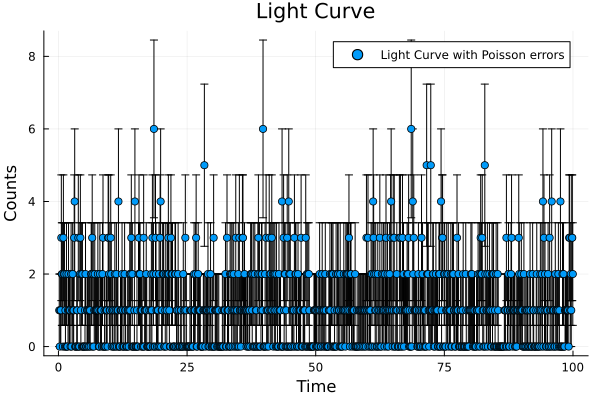

In [8]:
event_list = readevents("sample_event_data_lc.fits")
plot(event_list, 0.1)



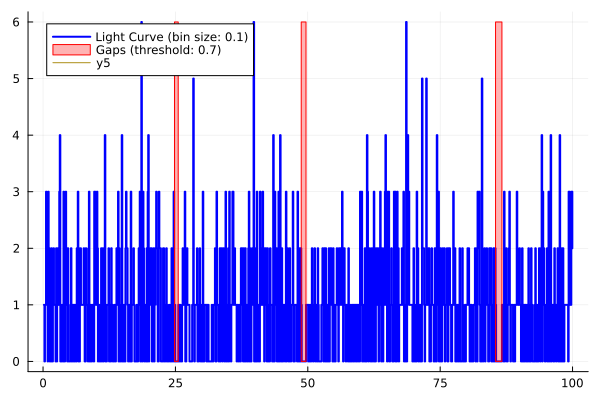

In [9]:
#implmentaion getting via using threshold
plot(event_list, 0.1, show_gaps=true, gap_threshold=10.0)

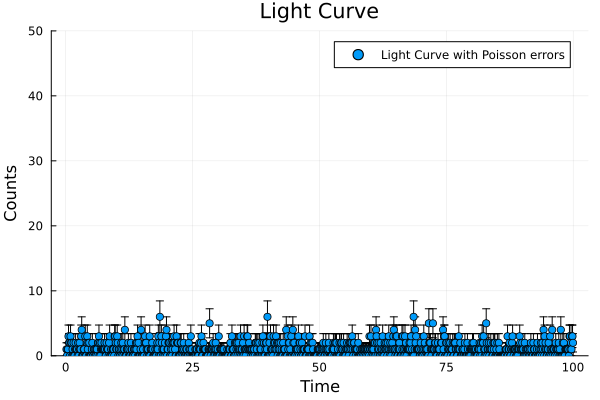

In [11]:
plot(event_list, axis_limits=[nothing, nothing, 0, 50])

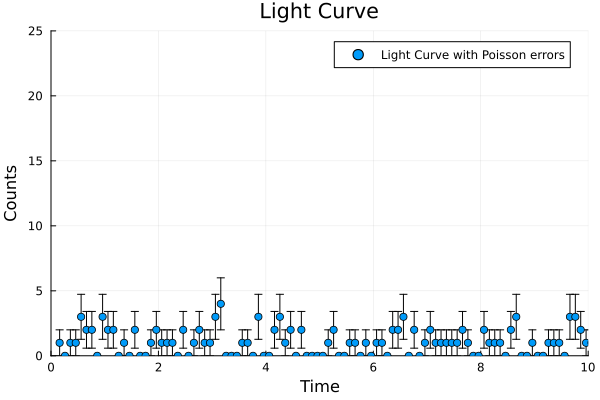

In [12]:
plot(event_list, axis_limits=[0, 10, 0, 25])

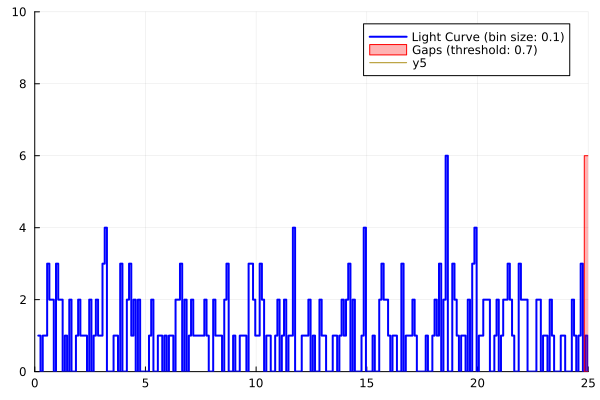

In [13]:
plot(event_list, 0.1, show_gaps=true, gap_threshold=10.0,axis_limits=[0, 25, 0, 10] )

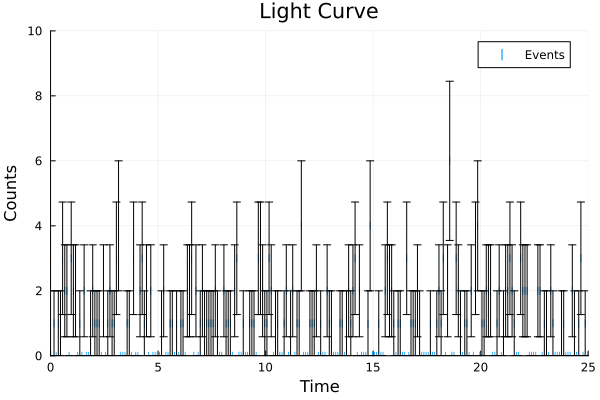

In [14]:
plot(event_list, 0.1, seriestype=:events,axis_limits=[0, 25, 0, 10])

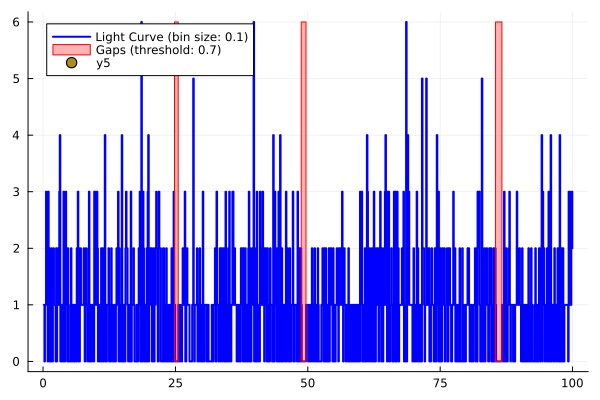

In [15]:
plot(event_list, 0.1, seriestype=:scatter, show_gaps=true, gap_threshold=10.0)

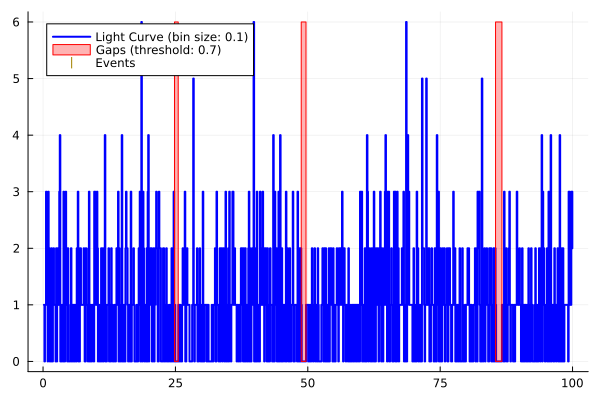

In [16]:
plot(event_list, 0.1, seriestype=:events, show_gaps=true, gap_threshold=10.0)

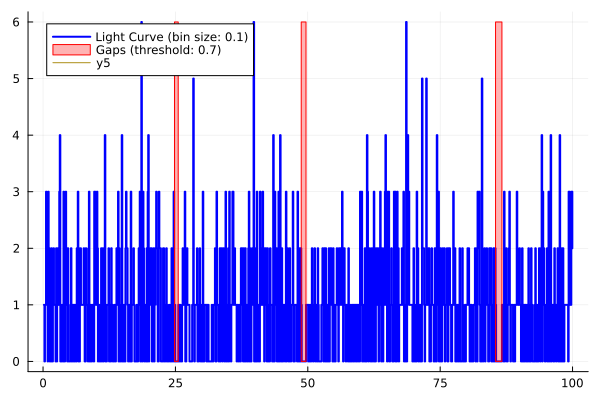

In [17]:
plot(event_list, 0.1, seriestype=:steppost, show_gaps=true, gap_threshold=10.0)

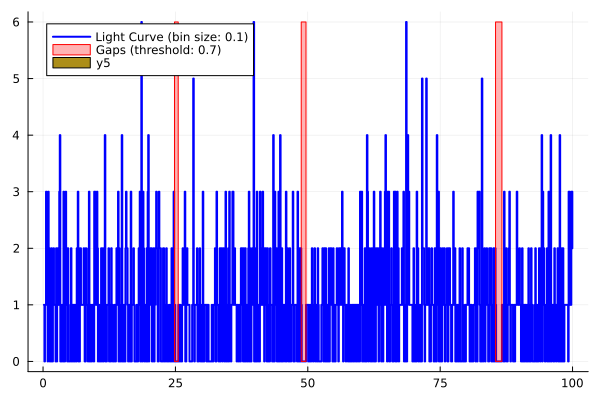

In [18]:
plot(event_list, 0.1, seriestype=:shape, show_gaps=true, gap_threshold=10.0)

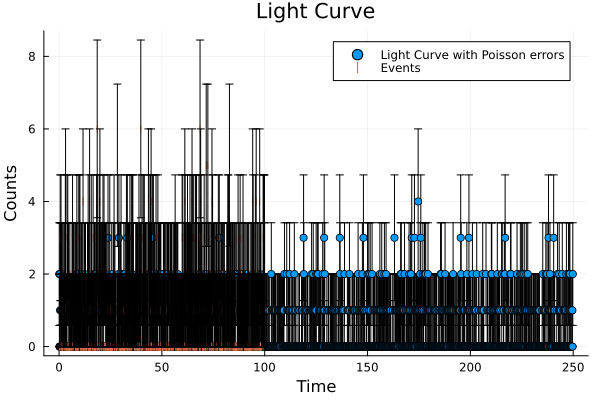

In [19]:
light_curve = readevents("sample_event_data_lc1.fits")
plot(event_list, seriestype=:events)
plot(event_list, seriestype=:events, color_by_energy=true)
plot(event_list, seriestype=:events, tstart=100, tseg=200)
p1 = plot(light_curve)
p2 = plot(event_list, seriestype=:events)
plot(p1, p2, layout=(2,1))

p = plot(light_curve)
plot!(p, event_list, seriestype=:events)
p = plot(light_curve)
plot!(p, event_list, seriestype=:events, color_by_energy=true)

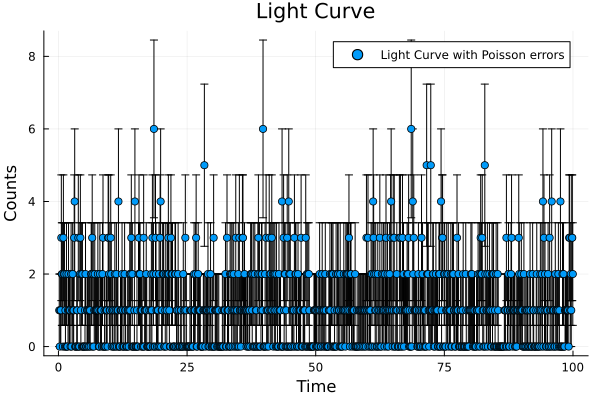

In [20]:

plot(event_list, energy_range=(0.1, 5.0), time_range=(10, 90))

In [23]:
#just playing with graphs:) i liked my implmentaion eheheh

In [ ]:
#the below codes are for teting puroses :)

In [24]:
function get_gti_lengths(gti)
    return [interval[2] - interval[1] for interval in gti]
end
function get_total_gti_length(gti::AbstractMatrix{<:Real}; minlen::Real=0.0)
    lengths = diff(gti; dims =2)
    return sum(x->x > minlen ? x : zero(x), lengths)
end
function get_btis(gtis::AbstractMatrix{<:Real})
    if isempty(gtis)
        throw(ArgumentError("Empty GTI and no valid start_time and stop_time"))
    end
    return get_btis(gtis, gtis[1,1], gtis[end,2])
end

get_btis (generic function with 1 method)

In [37]:
function calculate_exposure_statistics(filepath::String)
    # Load the FITS file
    events = readevents(filepath)
    
    # Extract GTI data 
    gti_data = nothing
    FITS(filepath, "r") do f
        for i = 1:length(f)
            hdu = f[i]
            if isa(hdu, TableHDU)
                colnames = FITSIO.colnames(hdu)
                if "START" in colnames && "STOP" in colnames
                    start_times = read(hdu, "START")
                    stop_times = read(hdu, "STOP")
                    gti_data = hcat(start_times, stop_times)
                    break
                end
            end
        end
    end
    
    if isnothing(gti_data)
        error("No GTI data found in FITS file")
    end
    
    # Calculate total observation time
    total_obs_time = gti_data[end,2] - gti_data[1,1]
    
    # Calculate GTI statistics
    total_gti_length = get_total_gti_length(gti_data)
    
    # Calculate BTI statistics
    btis = get_btis(gti_data)
    total_bti_length = sum(btis[:,2] - btis[:,1])
    
    # Calculate short BTIs (less than 100 seconds)
    short_btis = btis[btis[:,2] - btis[:,1] .< 100, :]
    total_short_bti_length = sum(short_btis[:,2] - short_btis[:,1])
    
    # Print the results
    println("File: ", filepath)
    println("Total observation time: ", total_obs_time, " seconds")
    println("Total exposure: ", total_gti_length, " seconds")
    println("Total BTI length: ", total_bti_length, " seconds")
    println("Total BTI length (short BTIs): ", total_short_bti_length, " seconds")
    
    return Dict(
        "observation_time" => total_obs_time,
        "exposure" => total_gti_length,
        "bti_length" => total_bti_length,
        "short_bti_length" => total_short_bti_length,
        "gtis" => gti_data,
        "btis" => btis
    )
end

# Extract the data from your FITS file
stats = calculate_exposure_statistics("sample_event_data_lc5.fits")

File: sample_event_data_lc5.fits
1000.0 secondsion time: 
Total exposure: 830.0 seconds
Total BTI length: 170.0 seconds
Total BTI length (short BTIs): 70.0 seconds


Dict{String, Any} with 6 entries:
  "bti_length"       => 170.0
  "gtis"             => [0.0 100.0; 150.0 300.0; 320.0 600.0; 700.0 1000.0]
  "exposure"         => 830.0
  "observation_time" => 1000.0
  "short_bti_length" => 70.0
  "btis"             => [100.0 150.0; 300.0 320.0; 600.0 700.0]

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194


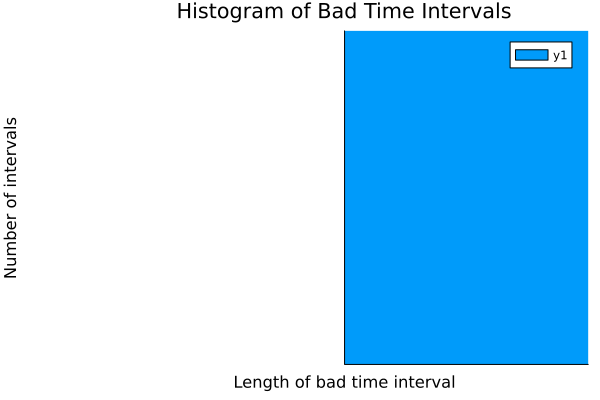

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\asus4\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌

In [42]:
using RecipesBase, StatsBase

# Define a struct for BTI plotting
struct BTIHistogram{T}
    bti_lengths::Vector{T}  # Lengths of bad time intervals
    bins::Int
end

# Function to create a BTI histogram plot object
function bti_histogram(event_list::EventList{T}; bins=30) where T
    bti_lengths = diff(event_list.times)  # Compute time gaps as BTI lengths
    return BTIHistogram{T}(bti_lengths, bins)
end

# Recipe for plotting the BTI histogram
@recipe function f(bti_hist::BTIHistogram)
    bti_lengths = bti_hist.bti_lengths
    bins = bti_hist.bins

    # Compute histogram using the correct method
    hist = fit(Histogram, bti_lengths; nbins=bins)
    bin_edges = hist.edges[1]
    bin_counts = hist.weights
    
    # Set logarithmic scale
    xscale --> :log10
    yscale --> :log10
    
    # Set axis labels and title
    xlabel --> "Length of bad time interval"
    ylabel --> "Number of intervals"
    title --> "Histogram of Bad Time Intervals"
    seriestype --> :bar
    
    # Return histogram bin centers and counts
    bin_centers = [(bin_edges[i] + bin_edges[i+1]) / 2 for i in 1:length(bin_edges)-1]
    return bin_centers, bin_counts
end

# Load event data and create plots
event_list = readevents("sample_event_data_lc5.fits")

# Plot BTI histogram
plot(bti_histogram(event_list))